In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from datasets import *
# source https://multibandtexture.recherche.usherbrooke.ca/original_brodatz.html
data = Dataset("datasets/Original Brodatz")
print(len(data.images))
imgs = data.ToNumpy()

112


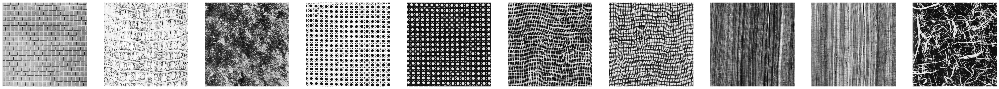

In [3]:
from vizutils import *

ImShowArray(imgs[:10])

# Basic - mean and standart deviation

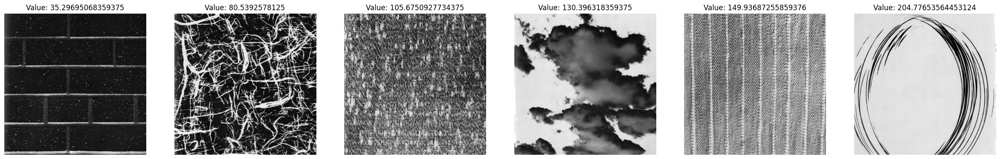

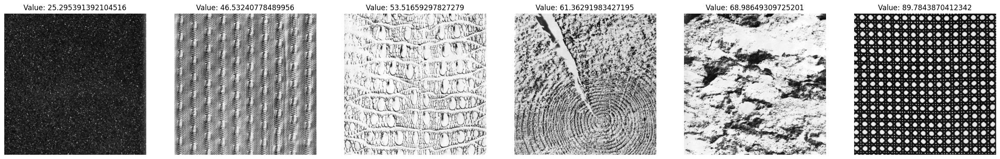

In [4]:
from computils import *

def Mean(img):
    return np.mean(img)

def Std(img):
    return np.std(img)

res = Calc(imgs, Mean)
SortAndShow(imgs,res,5)

res = Calc(imgs, Std)
SortAndShow(imgs,res,5)

# GLCM

In [5]:
from skimage.feature import graycomatrix

def glcm_featrues(img):
    glcm = graycomatrix(img, [2], [np.pi/4],normed=True)
    features = dict()
    features["energy"] = np.sum(np.square(glcm))
    features["entropy"] = -np.sum(glcm * np.log(glcm + 1e-10))
    var = np.std(glcm)
    mean = np.mean(glcm)
    corelation = 0
    homogenity = 0
    contrast = 0
    for i in range(0, glcm.shape[0]):
        for j in range(0, glcm.shape[1]):
            contrast += glcm[i,j,0,0] * (i-j)**2
            homogenity += glcm[i,j,0,0] / (1 + (i-j)**2)
            corelation += glcm[i,j,0,0] * ((i-mean)*(j-mean))/var

    features["contrast"] = contrast
    features["homogeneity"] = homogenity
    features["corelation"] = corelation

    return features

imgs_subset = imgs[:50]
res = Calc(imgs_subset, glcm_featrues)


== Energy == 


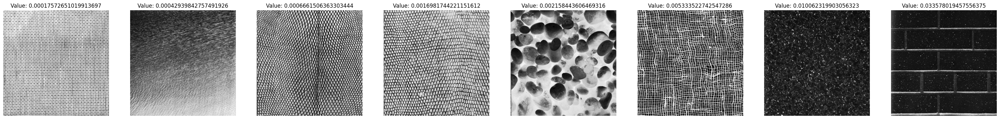

== Contrast == 


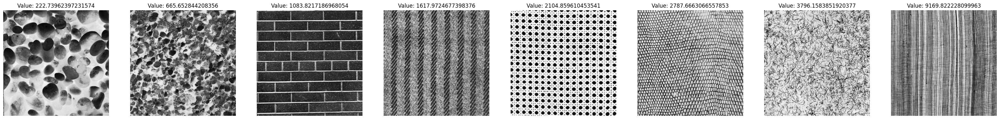

== Homogeneity == 


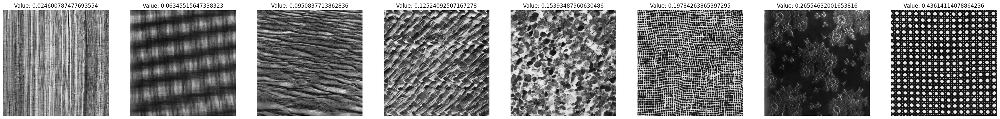

== Entropy == 


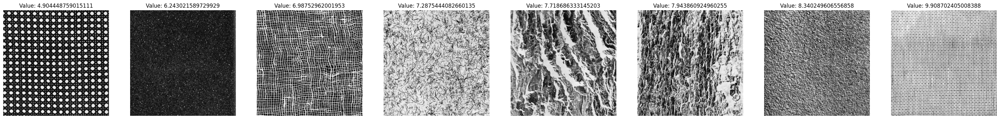

== Corelation == 


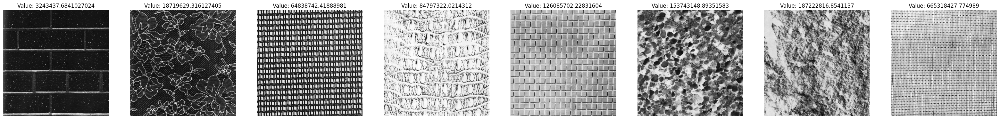

In [6]:
print("== Energy == ")
SortAndShow(imgs_subset,[e["energy"] for e in res],7)
print("== Contrast == ")
SortAndShow(imgs_subset,[e["contrast"] for e in res],7)
print("== Homogeneity == ")
SortAndShow(imgs_subset,[e["homogeneity"] for e in res],7)
print("== Entropy == ")
SortAndShow(imgs_subset,[e["entropy"] for e in res],7)
print("== Corelation == ")
SortAndShow(imgs_subset,[e["corelation"] for e in res],7)

- **energy** or uniformity is stronger when the propabilities are more evenly distributed
- **contrast** is stronger when there is higher propability of pixels with **different values** (i - j is hight)
- **homogenity** is bassicaly oposite of contrast, diagonal matrix would have maximal value
- **entropy** has higher values for textures where gray values occur more randomly
- 



## Segmentation with glcm


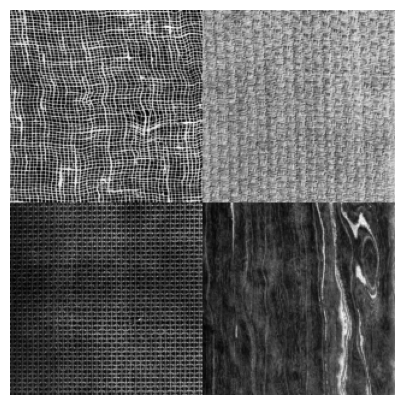

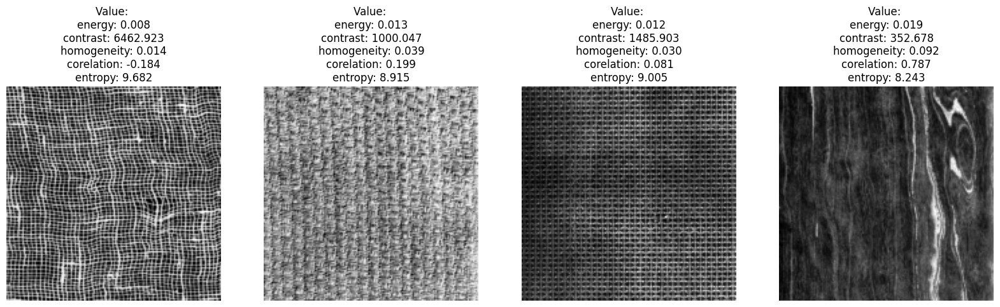

  0%|          | 0/305 [00:00<?, ?it/s]

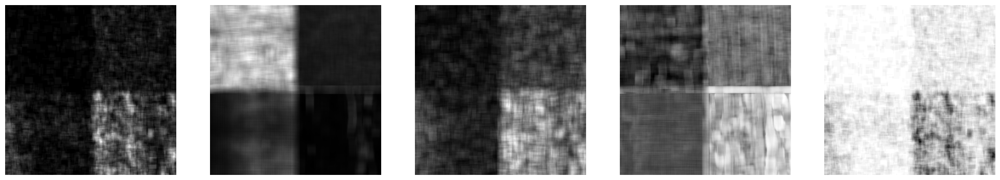

[[0. 0. 0. ... 1. 1. 1.]
 [0. 0. 0. ... 2. 1. 1.]
 [0. 0. 0. ... 2. 2. 1.]
 ...
 [2. 2. 2. ... 3. 3. 3.]
 [2. 2. 2. ... 3. 3. 3.]
 [2. 2. 2. ... 3. 3. 3.]]


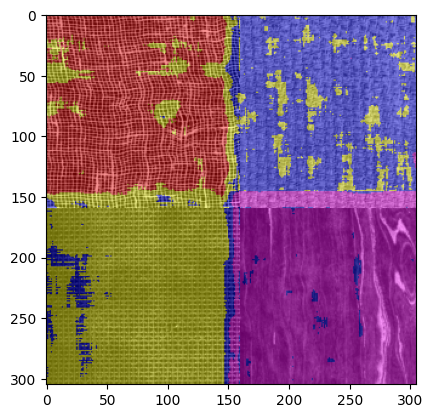

In [7]:
from skimage.feature import graycoprops
def glcm_featrues_fast(img):
    glcm = graycomatrix(img, [2], [np.pi/4],normed=True)
    features = dict()
    features["energy"] =    graycoprops(glcm, 'energy')[0,0]
    features["contrast"] = graycoprops(glcm, 'contrast')[0,0]
    features["homogeneity"] = graycoprops(glcm, 'homogeneity')[0,0]
    features["corelation"] = graycoprops(glcm, 'correlation')[0,0]
    features["entropy"] = -np.sum(glcm * np.log(glcm + 1e-10))
    return features
 
   

from skimage.transform import resize
size = 160
test_imgs = [imgs[5],imgs[93],imgs[60],imgs[80]]
_ = SegmentationExample(test_imgs, glcm_featrues_fast, size)


